# Milestone 2 – Complete Climate Analysis

This notebook combines all analysis from three sources:
1. **Core Statistical Analysis** (distributions, correlations, extreme events, choropleth maps)
2. **Advanced Pandas & Visualizations** (groupby/agg/transform/rolling/merge/quantile, Z-score, IQR, skewness, heatmaps, bar/line/pie/violin/histogram charts)
3. **Time Series Analysis** (decomposition, ADF test, ACF/PACF, anomaly detection, EWM forecasting, cross-correlation)

**Dataset columns used:** temperature, humidity, wind, precipitation, pressure, visibility, UV index, cloud cover, feels-like, gust, heat index, all 6 air-quality pollutants, condition text, wind direction, latitude, longitude, sunrise/sunset, hour, day-of-week, month.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings

warnings.filterwarnings('ignore')
sns.set_theme(style='whitegrid')
print("All libraries loaded ✓")


All libraries loaded ✓


## 1. Data Loading & Feature Engineering

In [2]:
# ── Load & enrich the cleaned dataset ─────────────────────────────────────
df = pd.read_csv('../data/cleaned_weather_data.csv')

df['last_updated']  = pd.to_datetime(df['last_updated'])
df['date']          = df['last_updated'].dt.normalize()
df['month']         = df['last_updated'].dt.month
df['month_name']    = df['last_updated'].dt.strftime('%B')
df['hour']          = df['last_updated'].dt.hour
df['week']          = df['last_updated'].dt.isocalendar().week.astype(int)
df['day_of_week']   = df['last_updated'].dt.day_name()

# Vectorized: approximate heat index
df['heat_index'] = (
    df['temperature_celsius']
    + 0.33 * (df['humidity'] / 100 * 6.105
              * np.exp(17.27 * df['temperature_celsius']
                       / (237.7 + df['temperature_celsius'])))
    - 4.0
)

# Vectorized: daylight duration from sunrise / sunset strings
def parse_time(t):
    try:
        return pd.to_datetime(t, format='%I:%M %p')
    except Exception:
        return pd.NaT

df['sunrise_dt']       = df['sunrise'].apply(parse_time)
df['sunset_dt']        = df['sunset'].apply(parse_time)
df['daylight_minutes'] = (df['sunset_dt'] - df['sunrise_dt']).dt.total_seconds() / 60

print(f"Shape: {df.shape}  |  Date range: {df['date'].min()} → {df['date'].max()}")
df.head(3)


Shape: (124136, 45)  |  Date range: 2024-05-16 00:00:00 → 2026-02-14 00:00:00


,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,date,month,month_name,hour,week,day_of_week,heat_index,sunrise_dt,sunset_dt,daylight_minutes
0,Afghanistan,Kabul,34.52,69.18,Asia/Kabul,1715849100,2024-05-16 13:15:00,26.6,79.8,Partly Cloudy,...,2024-05-16,5,May,13,20,Thursday,25.349550,1900-01-01 04:50:00,1900-01-01 18:50:00,840.0
1,Albania,Tirana,41.33,19.82,Europe/Tirane,1715849100,2024-05-16 10:45:00,19.0,66.2,Partly cloudy,...,2024-05-16,5,May,10,20,Thursday,21.799388,1900-01-01 05:21:00,1900-01-01 19:54:00,873.0
2,Algeria,Algiers,36.76,3.05,Africa/Algiers,1715849100,2024-05-16 09:45:00,23.0,73.4,Sunny,...,2024-05-16,5,May,9,20,Thursday,21.681027,1900-01-01 05:40:00,1900-01-01 19:50:00,850.0


## 2. Summary Statistics & Skewness

In [3]:
numerical_cols = [
    'temperature_celsius', 'wind_mph', 'precip_mm', 'humidity',
    'uv_index', 'pressure_mb', 'visibility_km', 'cloud',
    'feels_like_celsius', 'gust_mph', 'heat_index',
    'air_quality_PM2.5', 'air_quality_PM10',
    'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
    'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide'
]

summary = df[numerical_cols].describe().T
summary['skewness'] = df[numerical_cols].skew()
summary['IQR'] = df[numerical_cols].quantile(0.75) - df[numerical_cols].quantile(0.25)
summary

,count,mean,std,min,25%,50%,75%,max,skewness,IQR
temperature_celsius,124136.0,21.633843,9.566241,-29.80000,16.300000,24.10000,28.100000,49.200000,-0.889970,11.800000
wind_mph,124136.0,8.070967,7.379596,2.20000,4.000000,6.90000,11.000000,1841.200000,124.077524,7.000000
precip_mm,124136.0,0.136934,0.571963,0.00000,0.000000,0.00000,0.030000,42.240000,17.707014,0.030000
humidity,124136.0,66.111765,24.022788,2.00000,50.000000,71.00000,85.000000,100.000000,-0.619230,35.000000
uv_index,124136.0,3.451833,3.566574,0.00000,0.100000,2.20000,6.000000,16.300000,0.843001,5.900000
pressure_mb,124136.0,1014.059290,10.630259,947.00000,1010.000000,1014.00000,1018.000000,3006.000000,105.538378,8.000000
visibility_km,124136.0,9.520043,2.669008,0.00000,10.000000,10.00000,10.000000,32.000000,1.079628,0.000000
cloud,124136.0,40.059121,34.075425,0.00000,0.000000,31.00000,75.000000,100.000000,0.229804,75.000000
feels_like_celsius,124136.0,22.534428,11.434023,-36.70000,16.300000,25.30000,30.100000,51.200000,-0.870336,13.800000
gust_mph,124136.0,11.375632,8.708902,2.20000,6.400000,9.60000,15.100000,1845.700000,76.046497,8.700000


## 3. groupby() + agg() – Country-level Aggregations

In [4]:
# groupby + agg: Multiple statistics per country
country_stats = df.groupby('country').agg(
    avg_temp   = ('temperature_celsius', 'mean'),
    max_temp   = ('temperature_celsius', 'max'),
    min_temp   = ('temperature_celsius', 'min'),
    avg_humidity  = ('humidity', 'mean'),
    avg_uv     = ('uv_index', 'mean'),
    avg_precip = ('precip_mm', 'mean'),
    avg_wind   = ('wind_mph', 'mean'),
    avg_pm25   = ('air_quality_PM2.5', 'mean'),
    avg_pm10   = ('air_quality_PM10', 'mean'),
    obs_count  = ('temperature_celsius', 'count')
).reset_index()

print(f'Countries: {len(country_stats)}')
country_stats.head(10)

Countries: 211


,country,avg_temp,max_temp,min_temp,avg_humidity,avg_uv,avg_precip,avg_wind,avg_pm25,avg_pm10,obs_count
0,Afghanistan,19.407053,36.3,-6.7,25.521944,5.672571,0.036207,5.428370,19.447328,42.356889,638
1,Albania,20.286050,39.2,-4.7,55.630094,3.508777,0.141944,5.548276,15.196520,20.396082,638
2,Algeria,21.306593,38.2,2.1,62.350078,2.818210,0.047331,8.200942,19.161146,34.945204,637
3,Andorra,9.819749,28.9,-14.4,62.957680,2.242476,0.127100,5.168652,4.709588,8.634135,638
4,Angola,26.124138,32.2,19.3,74.192790,4.834483,0.027633,5.830094,32.931505,50.258339,638
5,Antigua and Barbuda,26.506467,31.4,21.0,78.839117,1.243849,0.117681,15.047161,10.775421,21.544385,634
6,Argentina,14.639623,27.3,0.3,82.139937,0.994969,0.091730,6.471541,11.790951,13.715000,636
7,Armenia,17.685893,39.3,-13.0,43.065831,4.917555,0.041129,4.505329,14.373119,23.297445,638
8,Australia,14.565987,39.1,-3.7,65.750784,0.496082,0.104655,7.557680,7.859475,9.475854,638
9,Austria,13.336107,35.5,-7.7,67.408163,2.617111,0.076562,8.050392,18.102763,21.886013,637


## 4. groupby() + transform() – Z-Score Anomaly Flags

In [5]:
# transform(): compute Z-score of temperature within each country
df['temp_mean_by_country'] = df.groupby('country')['temperature_celsius'].transform('mean')
df['temp_std_by_country']  = df.groupby('country')['temperature_celsius'].transform('std')
df['temp_zscore']          = (df['temperature_celsius'] - df['temp_mean_by_country']) / df['temp_std_by_country']

# Anomaly flag: |Z| > 2.5
df['temp_anomaly'] = df['temp_zscore'].abs() > 2.5

# Also compute global Z-score for all numericals
for col in ['humidity', 'wind_mph', 'precip_mm', 'uv_index', 'pressure_mb']:
    df[f'{col}_zscore'] = (df[col] - df[col].mean()) / df[col].std()

print(f'Total temperature anomalies detected: {df["temp_anomaly"].sum()}')
df[df['temp_anomaly']][['country', 'location_name', 'last_updated',
                         'temperature_celsius', 'temp_zscore']].head(10)

Total temperature anomalies detected: 1084


,country,location_name,last_updated,temperature_celsius,temp_zscore
84,Jamaica,Norman Gardens,2024-05-16 03:45:00,21.9,-2.646846
181,Tuvalu,Funafuti,2024-05-16 20:45:00,26.0,-2.897146
212,Belize,Belmopan,2024-05-16 08:00:00,30.0,2.539372
218,Brazil,Bras,2024-05-16 10:00:00,31.4,2.617595
245,Ecuador,Quito,2024-05-16 09:00:00,16.2,3.763157
264,Guinea,Conakry,2024-05-16 14:00:00,31.0,2.643115
362,Suriname,Paramaribo,2024-05-16 11:15:00,31.0,3.758776
372,Trinidad and Tobago,Port Of Spain,2024-05-16 10:00:00,31.0,3.072747
407,Belize,Belmopan,2024-05-17 10:00:00,32.0,3.199314
439,Dominican Republic,Santo Domingo,2024-05-17 12:00:00,32.0,3.441259


## 5. rolling() – Monthly Rolling Average Temperature

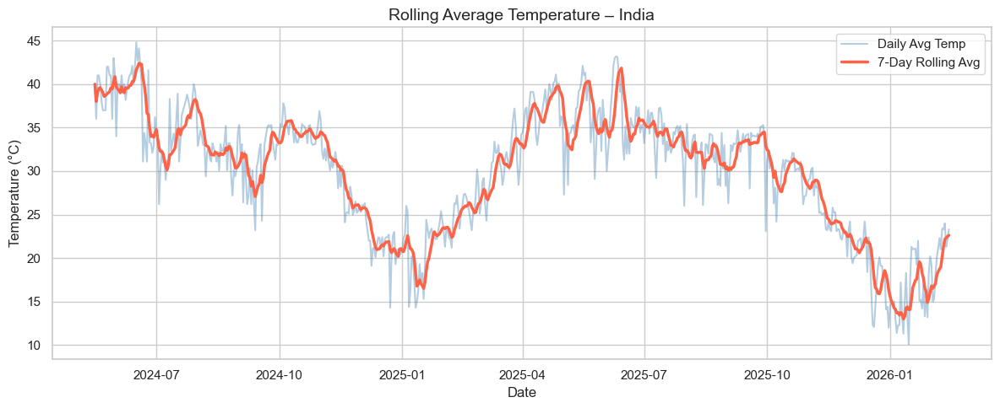

In [6]:
# rolling(): Daily average, then 7-day rolling average for a sample country
sample_country = 'India'
df_country = df[df['country'] == sample_country].copy()
df_country = df_country.sort_values('last_updated')

# Daily average
daily_avg = df_country.groupby('date')['temperature_celsius'].mean().reset_index()
daily_avg.columns = ['date', 'avg_temp']
daily_avg['date'] = pd.to_datetime(daily_avg['date'])
daily_avg = daily_avg.sort_values('date')

# 7-day rolling average
daily_avg['rolling_7d'] = daily_avg['avg_temp'].rolling(window=7, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(daily_avg['date'], daily_avg['avg_temp'], alpha=0.4, label='Daily Avg Temp', color='steelblue')
ax.plot(daily_avg['date'], daily_avg['rolling_7d'], linewidth=2.5, label='7-Day Rolling Avg', color='tomato')
ax.set_title(f'Rolling Average Temperature – {sample_country}', fontsize=14)
ax.set_xlabel('Date')
ax.set_ylabel('Temperature (°C)')
ax.legend()
plt.tight_layout()
plt.show()

## 6. merge() – Joining Country Stats Back to Main Dataset

In [7]:
# merge(): join country-level aggregates back to main dataframe
df_merged = df.merge(country_stats[['country', 'avg_temp', 'avg_pm25']], on='country', how='left')

# Compute how much each observation deviates from its country average
df_merged['temp_dev_from_country_avg'] = df_merged['temperature_celsius'] - df_merged['avg_temp']

print('Merged shape:', df_merged.shape)
df_merged[['country', 'temperature_celsius', 'avg_temp', 'temp_dev_from_country_avg']].head(5)

Merged shape: (124136, 57)


,country,temperature_celsius,avg_temp,temp_dev_from_country_avg
0,Afghanistan,26.6,19.407053,7.192947
1,Albania,19.0,20.286050,-1.286050
2,Algeria,23.0,21.306593,1.693407
3,Andorra,6.3,9.819749,-3.519749
4,Angola,26.0,26.124138,-0.124138


## 7. quantile() – IQR-based Outlier Detection

In [8]:
# IQR outlier detection for key variables
outlier_summary = {}

for col in ['temperature_celsius', 'precip_mm', 'wind_mph', 'humidity',
             'air_quality_PM2.5', 'air_quality_PM10']:
    Q1  = df[col].quantile(0.25)
    Q3  = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    n_outliers = ((df[col] < lower) | (df[col] > upper)).sum()
    outlier_summary[col] = {
        'Q1': round(Q1, 2), 'Q3': round(Q3, 2),
        'IQR': round(IQR, 2),
        'Lower Fence': round(lower, 2),
        'Upper Fence': round(upper, 2),
        'Outliers': n_outliers
    }

pd.DataFrame(outlier_summary).T

,Q1,Q3,IQR,Lower Fence,Upper Fence,Outliers
temperature_celsius,16.30,28.10,11.80,-1.40,45.80,2575.0
precip_mm,0.00,0.03,0.03,-0.04,0.08,23242.0
wind_mph,4.00,11.00,7.00,-6.50,21.50,2160.0
humidity,50.00,85.00,35.00,-2.50,137.50,0.0
air_quality_PM2.5,7.12,28.12,21.00,-24.38,59.62,10389.0
air_quality_PM10,10.05,42.20,32.15,-38.18,90.43,13197.0


## 8. Anomaly Detection & Extreme Events

In [9]:
# 99th percentile thresholds
temp_99   = df['temperature_celsius'].quantile(0.99)
precip_99 = df['precip_mm'].quantile(0.99)
wind_99   = df['wind_mph'].quantile(0.99)
pm25_99   = df['air_quality_PM2.5'].quantile(0.99)

extreme_heat   = df[df['temperature_celsius'] > temp_99]
extreme_rain   = df[df['precip_mm'] > precip_99]
extreme_wind   = df[df['wind_mph'] > wind_99]
extreme_pm25   = df[df['air_quality_PM2.5'] > pm25_99]

print(f'99th Percentile Temperature : {temp_99:.2f} °C  → {len(extreme_heat):,} events')
print(f'99th Percentile Precipitation: {precip_99:.2f} mm → {len(extreme_rain):,} events')
print(f'99th Percentile Wind         : {wind_99:.2f} mph → {len(extreme_wind):,} events')
print(f'99th Percentile PM2.5        : {pm25_99:.2f}    → {len(extreme_pm25):,} events')

99th Percentile Temperature : 40.00 °C  → 1,228 events
99th Percentile Precipitation: 2.15 mm → 1,224 events
99th Percentile Wind         : 23.30 mph → 1,190 events
99th Percentile PM2.5        : 167.06    → 1,237 events


In [10]:
# Top 5 hottest observations
print('Top 5 Hottest Observations:')
extreme_heat[['country','location_name','last_updated','temperature_celsius']]\
    .sort_values('temperature_celsius', ascending=False).head()

Top 5 Hottest Observations:


,country,location_name,last_updated,temperature_celsius
6896,Kuwait,Kuwait City,2024-06-19 16:45:00,49.2
11145,Iraq,Baghdad,2024-07-11 15:45:00,49.1
7460,Iraq,Baghdad,2024-06-22 16:45:00,49.1
8425,Kuwait,Kuwait City,2024-06-27 16:15:00,48.9
11338,Iraq,Baghdad,2024-07-12 15:45:00,48.8


In [11]:
# Worst Air Quality (PM2.5)
print('Top 5 Worst PM2.5 Air Quality:')
extreme_pm25[['country','location_name','last_updated','air_quality_PM2.5','air_quality_PM10']]\
    .sort_values('air_quality_PM2.5', ascending=False).head()

Top 5 Worst PM2.5 Air Quality:


,country,location_name,last_updated,air_quality_PM2.5,air_quality_PM10
4125,Chile,Santiago,2024-06-05 10:00:00,1614.1,1814.4
4513,Chile,Santiago,2024-06-07 10:00:00,1406.3,1622.1
12219,Chile,Santiago,2024-07-17 08:45:00,1204.9,1386.2
3930,Chile,Santiago,2024-06-04 10:15:00,1190.5,1383.0
14338,Chile,Santiago,2024-07-30 08:15:00,1188.4,1347.0


## 9. Correlation Heatmap

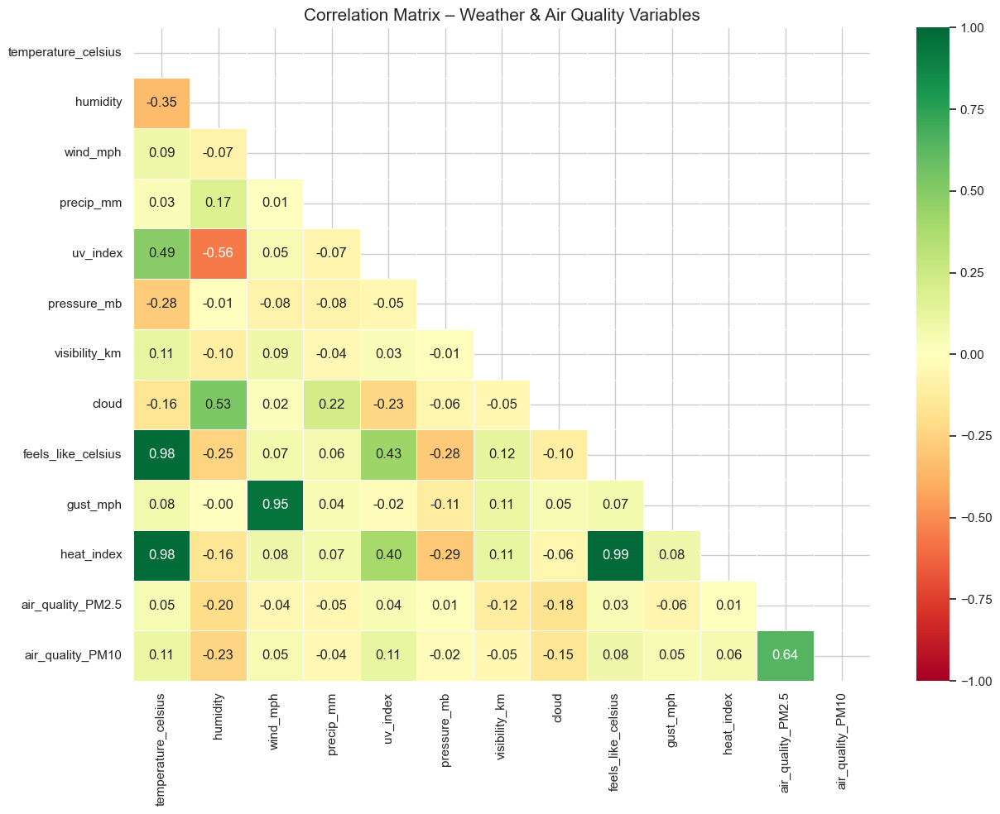

In [12]:
corr_cols = [
    'temperature_celsius', 'humidity', 'wind_mph', 'precip_mm',
    'uv_index', 'pressure_mb', 'visibility_km', 'cloud',
    'feels_like_celsius', 'gust_mph', 'heat_index',
    'air_quality_PM2.5', 'air_quality_PM10'
]

corr = df[corr_cols].corr()

plt.figure(figsize=(13, 10))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(
    corr, mask=mask, annot=True, fmt='.2f',
    cmap='RdYlGn', linewidths=0.5,
    vmin=-1, vmax=1, center=0
)
plt.title('Correlation Matrix – Weather & Air Quality Variables', fontsize=15)
plt.tight_layout()
plt.show()

## 10. Choropleth Maps

In [13]:
# Choropleth: Average Temperature by Country
fig = px.choropleth(
    country_stats,
    locations='country',
    locationmode='country names',
    color='avg_temp',
    color_continuous_scale='RdYlBu_r',
    title='🌡️  Average Temperature by Country (°C)',
    labels={'avg_temp': 'Avg Temp (°C)'}
)
fig.update_layout(height=500)
fig.show()

In [14]:
# Choropleth: Average PM2.5 Air Quality by Country
fig = px.choropleth(
    country_stats,
    locations='country',
    locationmode='country names',
    color='avg_pm25',
    color_continuous_scale='YlOrRd',
    title='🌫️  Average PM2.5 Air Quality by Country',
    labels={'avg_pm25': 'Avg PM2.5'}
)
fig.update_layout(height=500)
fig.show()

In [15]:
# Choropleth: Average UV Index by Country
fig = px.choropleth(
    country_stats,
    locations='country',
    locationmode='country names',
    color='avg_uv',
    color_continuous_scale='Plasma',
    title='☀️  Average UV Index by Country',
    labels={'avg_uv': 'Avg UV Index'}
)
fig.update_layout(height=500)
fig.show()

## 11. Bar Charts

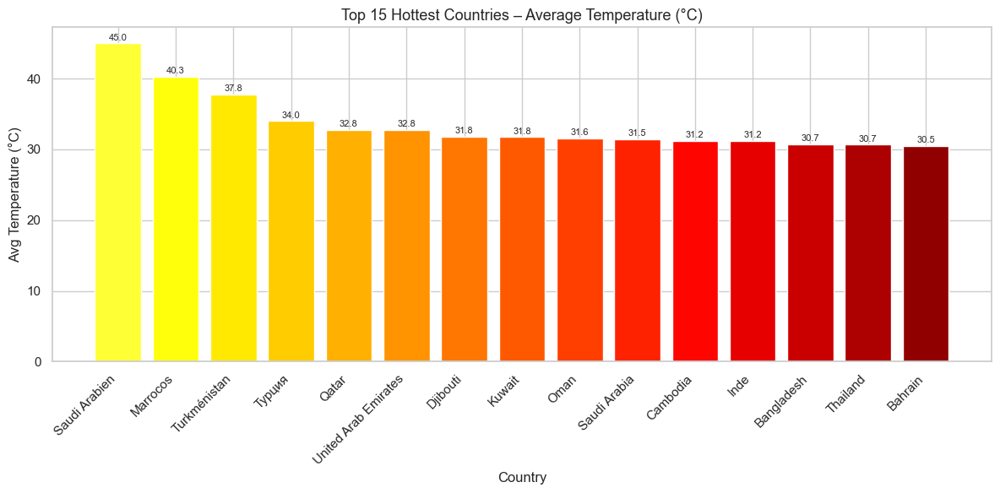

In [16]:
# Bar: Top 15 hottest countries by avg temperature
top_hot = country_stats.nlargest(15, 'avg_temp')

plt.figure(figsize=(12, 6))
bars = plt.bar(top_hot['country'], top_hot['avg_temp'],
               color=plt.cm.hot_r(np.linspace(0.2, 0.8, len(top_hot))))
plt.xticks(rotation=45, ha='right')
plt.title('Top 15 Hottest Countries – Average Temperature (°C)', fontsize=13)
plt.xlabel('Country')
plt.ylabel('Avg Temperature (°C)')
for bar, val in zip(bars, top_hot['avg_temp']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
             f'{val:.1f}', ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

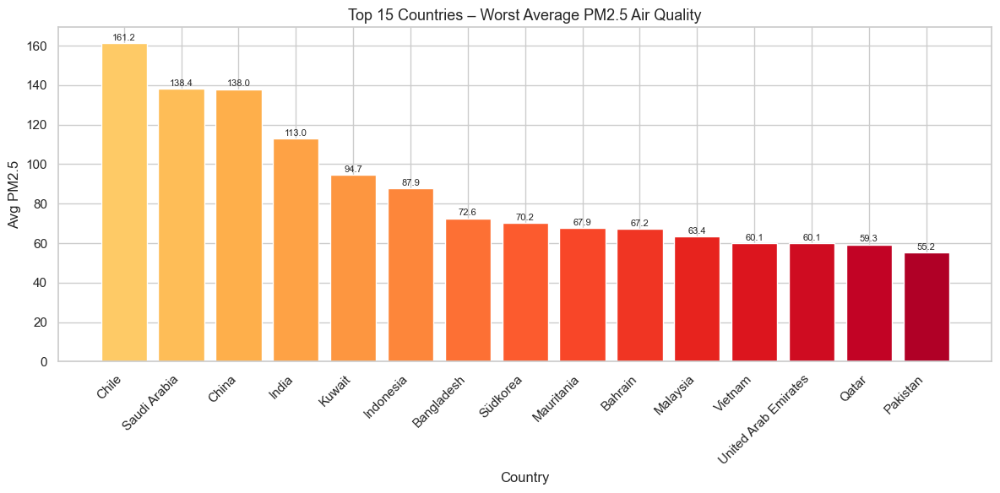

In [17]:
# Bar: Top 15 countries by average PM2.5 (worst air quality)
top_pm25 = country_stats.nlargest(15, 'avg_pm25')

plt.figure(figsize=(12, 6))
bars = plt.bar(top_pm25['country'], top_pm25['avg_pm25'],
               color=plt.cm.YlOrRd(np.linspace(0.3, 0.9, len(top_pm25))))
plt.xticks(rotation=45, ha='right')
plt.title('Top 15 Countries – Worst Average PM2.5 Air Quality', fontsize=13)
plt.xlabel('Country')
plt.ylabel('Avg PM2.5')
for bar, val in zip(bars, top_pm25['avg_pm25']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
             f'{val:.1f}', ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

## 12. Line Charts

In [19]:
# Line: Temperature trend over time for multiple countries (interactive)
df_line = df[df['country'].isin(top5_countries)].copy()
df_line = df_line.groupby(['country', 'date'])['temperature_celsius'].mean().reset_index()
df_line['date'] = pd.to_datetime(df_line['date'])

fig = px.line(
    df_line, x='date', y='temperature_celsius', color='country',
    title='📈 Daily Average Temperature Trend – Top 5 Countries',
    labels={'temperature_celsius': 'Avg Temp (°C)', 'date': 'Date'}
)
fig.update_layout(height=500, legend_title='Country')
fig.show()

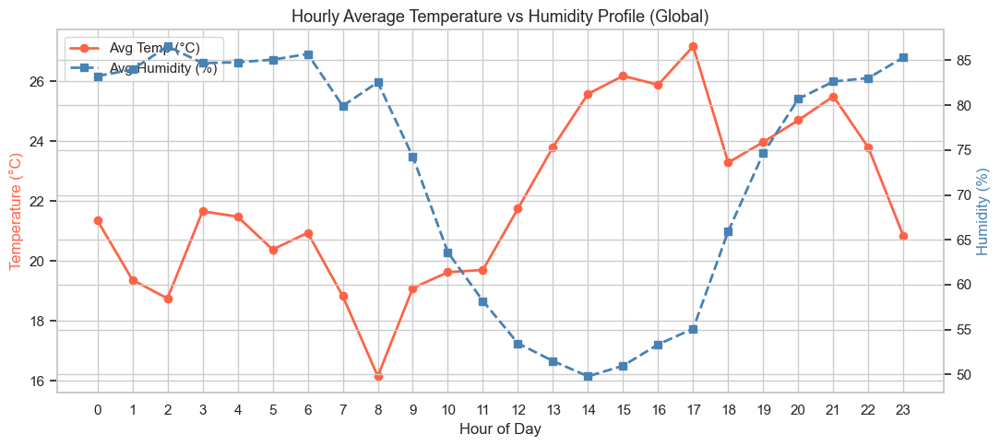

In [20]:
# Line: Hourly average temperature profile (global)
hourly_avg = df.groupby('hour').agg(
    avg_temp    = ('temperature_celsius', 'mean'),
    avg_humidity= ('humidity', 'mean'),
    avg_wind    = ('wind_mph', 'mean')
).reset_index()

fig, ax1 = plt.subplots(figsize=(11, 5))
ax2 = ax1.twinx()

ax1.plot(hourly_avg['hour'], hourly_avg['avg_temp'], 'o-', color='tomato', linewidth=2, label='Avg Temp (°C)')
ax2.plot(hourly_avg['hour'], hourly_avg['avg_humidity'], 's--', color='steelblue', linewidth=2, label='Avg Humidity (%)')

ax1.set_xlabel('Hour of Day')
ax1.set_ylabel('Temperature (°C)', color='tomato')
ax2.set_ylabel('Humidity (%)', color='steelblue')
ax1.set_xticks(range(0, 24))
ax1.set_title('Hourly Average Temperature vs Humidity Profile (Global)', fontsize=13)

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
plt.tight_layout()
plt.show()

## 13. Pie Chart – Weather Condition Distribution

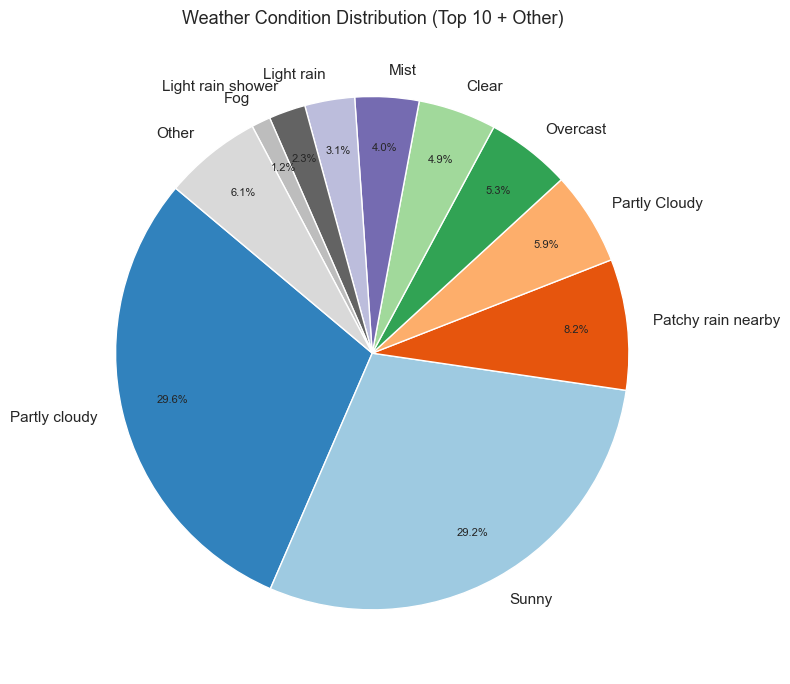

In [21]:
# Pie: Top 10 weather conditions
cond_counts = df['condition_text'].value_counts().head(10)
other_count = df['condition_text'].value_counts().iloc[10:].sum()

labels = list(cond_counts.index) + ['Other']
sizes  = list(cond_counts.values) + [other_count]

colors = plt.cm.tab20c(np.linspace(0, 1, len(labels)))

plt.figure(figsize=(10, 7))
wedges, texts, autotexts = plt.pie(
    sizes, labels=labels, autopct='%1.1f%%',
    colors=colors, startangle=140, pctdistance=0.8
)
for autotext in autotexts:
    autotext.set_fontsize(8)
plt.title('Weather Condition Distribution (Top 10 + Other)', fontsize=13)
plt.tight_layout()
plt.show()

## 14. Violin Plots

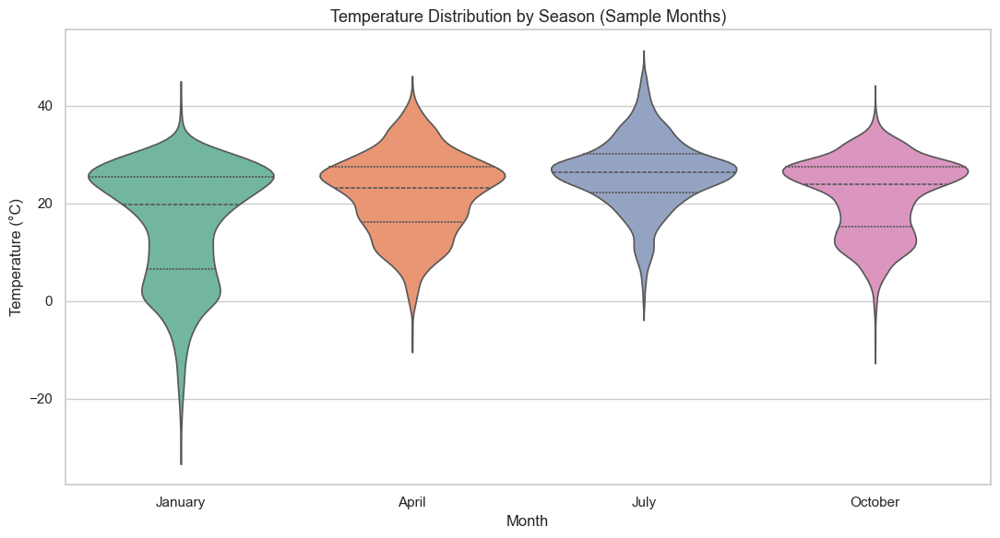

In [22]:
# Violin: Temperature distribution by month
df_violin = df[df['month_name'].isin(['January','April','July','October'])].copy()

plt.figure(figsize=(11, 6))
sns.violinplot(
    data=df_violin,
    x='month_name', y='temperature_celsius',
    palette='Set2', inner='quartile',
    order=['January','April','July','October']
)
plt.title('Temperature Distribution by Season (Sample Months)', fontsize=13)
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.tight_layout()
plt.show()

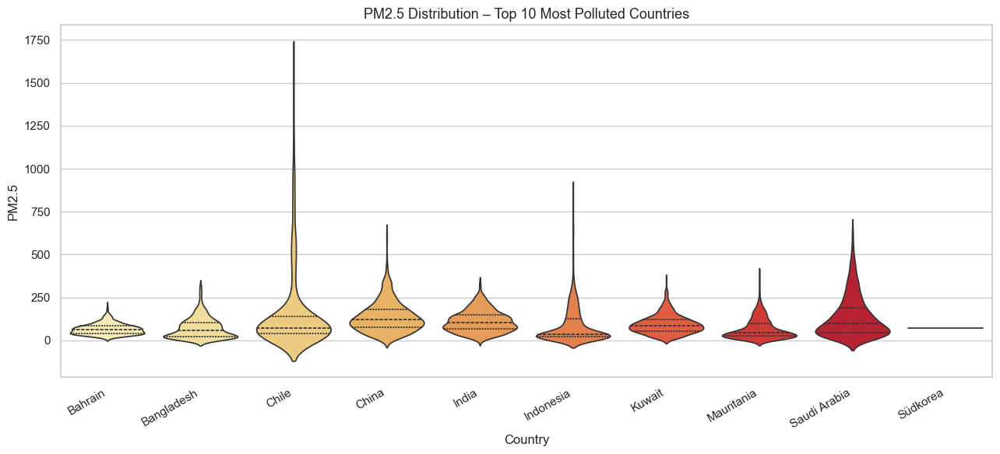

In [23]:
# Violin: PM2.5 Air Quality distribution for top 10 polluted countries
top10_pm25_countries = country_stats.nlargest(10, 'avg_pm25')['country'].tolist()
df_aq = df[df['country'].isin(top10_pm25_countries)]

plt.figure(figsize=(13, 6))
sns.violinplot(
    data=df_aq, x='country', y='air_quality_PM2.5',
    palette='YlOrRd', inner='quartile'
)
plt.xticks(rotation=30, ha='right')
plt.title('PM2.5 Distribution – Top 10 Most Polluted Countries', fontsize=13)
plt.xlabel('Country')
plt.ylabel('PM2.5')
plt.tight_layout()
plt.show()

## 15. Histograms

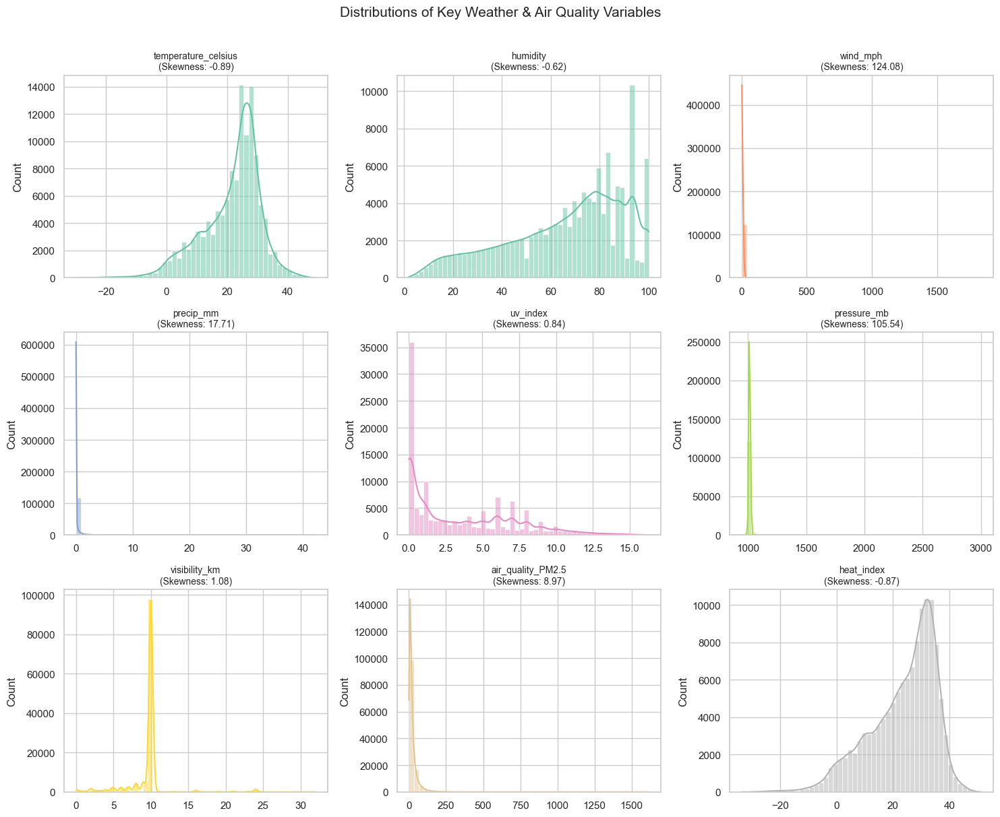

In [24]:
# Histograms for all key numerical variables
hist_cols = [
    'temperature_celsius', 'humidity', 'wind_mph',
    'precip_mm', 'uv_index', 'pressure_mb',
    'visibility_km', 'air_quality_PM2.5', 'heat_index'
]

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for i, col in enumerate(hist_cols):
    skew_val = df[col].skew()
    sns.histplot(df[col].dropna(), bins=50, kde=True, ax=axes[i],
                 color=plt.cm.Set2(i / len(hist_cols)))
    axes[i].set_title(f'{col}\n(Skewness: {skew_val:.2f})', fontsize=10)
    axes[i].set_xlabel('')

plt.suptitle('Distributions of Key Weather & Air Quality Variables', fontsize=15, y=1.01)
plt.tight_layout()
plt.show()

## 16. Additional: Wind Direction Analysis (Polar / Rose Plot)

In [25]:
# Wind direction frequency
wind_dir_counts = df['wind_direction'].value_counts().reset_index()
wind_dir_counts.columns = ['direction', 'count']

fig = px.bar_polar(
    wind_dir_counts, r='count', theta='direction',
    color='count',
    color_continuous_scale='Blues',
    title='🌬️  Wind Direction Distribution (Polar/Rose Plot)'
)
fig.update_layout(height=500)
fig.show()

## 17. Additional: Scatter Plot – Temperature vs Humidity (by Region)

In [26]:
# Scatter: Temp vs Humidity coloured by UV Index
sample = df.sample(5000, random_state=42)

fig = px.scatter(
    sample, x='temperature_celsius', y='humidity',
    color='uv_index',
    color_continuous_scale='plasma',
    hover_data=['country', 'condition_text'],
    title='🌡️  Temperature vs Humidity (coloured by UV Index)',
    labels={'temperature_celsius': 'Temperature (°C)', 'humidity': 'Humidity (%)'}
)
fig.update_traces(marker=dict(size=4, opacity=0.6))
fig.update_layout(height=500)
fig.show()

## 18. Additional: Box Plot – Multi-variable Outlier View

In [27]:
# Box plot using Plotly for key variables
box_cols = ['temperature_celsius', 'humidity', 'wind_mph',
            'uv_index', 'pressure_mb', 'visibility_km']

fig = go.Figure()
for col in box_cols:
    fig.add_trace(go.Box(y=df[col], name=col, boxpoints='outliers'))

fig.update_layout(
    title='📦 Multi-variable Box Plot (with Outliers)',
    height=550,
    showlegend=False
)
fig.show()

## 19. Additional: Z-Score Visualization – Global Anomaly Heatmap

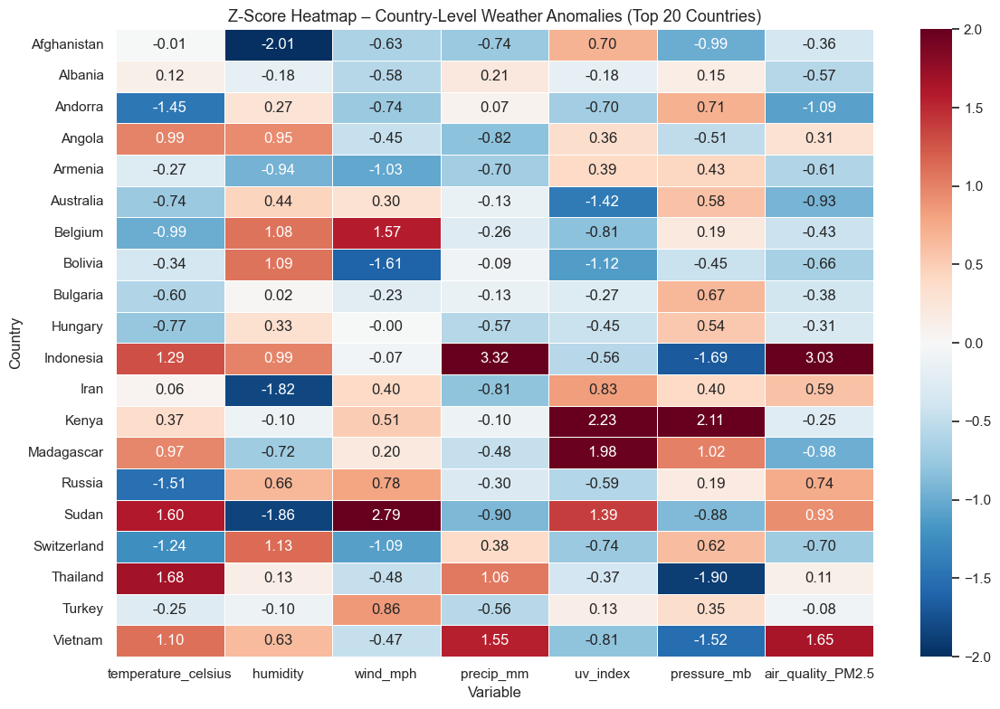

In [28]:
# Heatmap of variable Z-scores per country (top 20 countries by obs count)
top20_countries = country_stats.nlargest(20, 'obs_count')['country'].tolist()

zscore_cols = ['temperature_celsius', 'humidity', 'wind_mph',
               'precip_mm', 'uv_index', 'pressure_mb', 'air_quality_PM2.5']

country_zscores = df[df['country'].isin(top20_countries)].groupby('country')[zscore_cols].mean()
country_zscores_norm = (country_zscores - country_zscores.mean()) / country_zscores.std()

plt.figure(figsize=(12, 8))
sns.heatmap(
    country_zscores_norm,
    annot=True, fmt='.2f', cmap='RdBu_r',
    center=0, linewidths=0.5, vmin=-2, vmax=2
)
plt.title('Z-Score Heatmap – Country-Level Weather Anomalies (Top 20 Countries)', fontsize=13)
plt.xlabel('Variable')
plt.ylabel('Country')
plt.tight_layout()
plt.show()

---
## Part 3 – Time Series Analysis

In [29]:
# --- Global daily time series ---
daily_global = df.groupby('date').agg(
    avg_temp       = ('temperature_celsius', 'mean'),
    avg_humidity   = ('humidity', 'mean'),
    avg_wind       = ('wind_mph', 'mean'),
    avg_pressure   = ('pressure_mb', 'mean'),
    avg_precip     = ('precip_mm', 'mean'),
    avg_uv         = ('uv_index', 'mean'),
    avg_pm25       = ('air_quality_PM2.5', 'mean'),
    avg_pm10       = ('air_quality_PM10', 'mean'),
    obs_count      = ('temperature_celsius', 'count')
).reset_index()
daily_global['date'] = pd.to_datetime(daily_global['date'])
daily_global = daily_global.sort_values('date').set_index('date')

print(f'Daily series: {len(daily_global)} data points')
daily_global.head()

Daily series: 639 data points


,avg_temp,avg_humidity,avg_wind,avg_pressure,avg_precip,avg_uv,avg_pm25,avg_pm10,obs_count
date,,,,,,,,,
2024-05-16,23.767196,61.679894,9.120370,1013.412698,0.113175,4.986772,18.718254,33.194974,378
2024-05-17,24.451648,59.763736,8.692308,1013.269231,0.147088,4.021978,17.333516,32.553846,182
2024-05-18,25.355610,58.585366,8.293171,1012.853659,0.127854,4.960976,17.375122,33.416098,205
2024-05-19,25.270103,60.360825,8.533505,1012.041237,0.162938,5.190722,14.461340,30.090722,194
2024-05-20,25.430769,59.610256,9.017436,1012.441026,0.170513,5.164103,19.024103,36.299487,195


## 2. Trend Analysis – Rolling Statistics

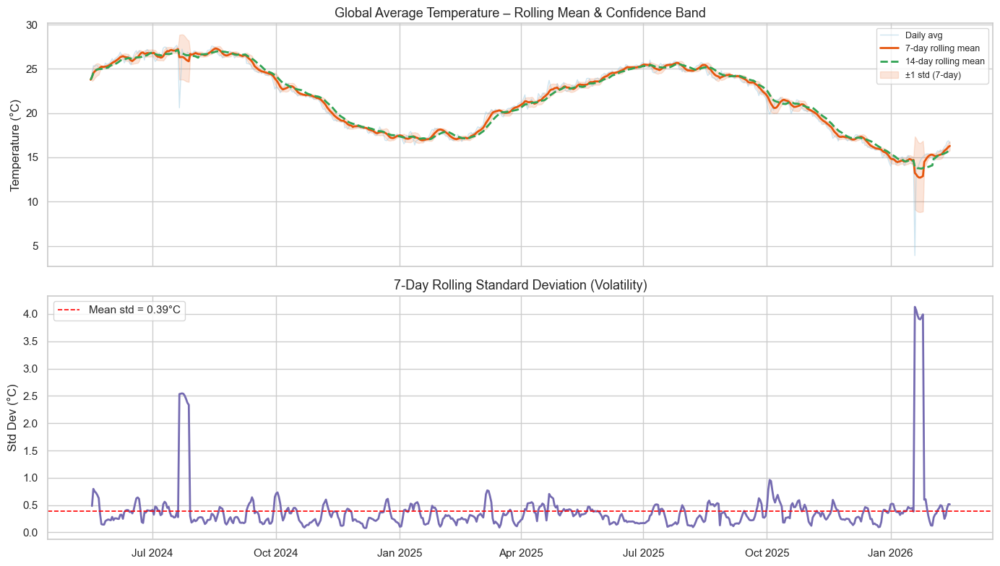

In [30]:
# Rolling mean & std for global temperature
ts = daily_global['avg_temp']
roll7  = ts.rolling(window=7,  min_periods=1).mean()
roll14 = ts.rolling(window=14, min_periods=1).mean()
roll_std7 = ts.rolling(window=7, min_periods=1).std()

fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# --- Rolling Mean ---
axes[0].plot(ts.index, ts,      color='#9ecae1', alpha=0.5, linewidth=1,   label='Daily avg')
axes[0].plot(ts.index, roll7,   color='#e6550d', linewidth=2,              label='7-day rolling mean')
axes[0].plot(ts.index, roll14,  color='#31a354', linewidth=2, linestyle='--', label='14-day rolling mean')
axes[0].fill_between(ts.index,
                      roll7 - roll_std7, roll7 + roll_std7,
                      alpha=0.15, color='#e6550d', label='±1 std (7-day)')
axes[0].set_title('Global Average Temperature – Rolling Mean & Confidence Band', fontsize=13)
axes[0].set_ylabel('Temperature (°C)')
axes[0].legend(loc='upper right', fontsize=9)

# --- Rolling Std (volatility) ---
axes[1].plot(ts.index, roll_std7, color='#756bb1', linewidth=2)
axes[1].axhline(roll_std7.mean(), color='red', linestyle='--', linewidth=1.2, label=f'Mean std = {roll_std7.mean():.2f}°C')
axes[1].set_title('7-Day Rolling Standard Deviation (Volatility)', fontsize=13)
axes[1].set_ylabel('Std Dev (°C)')
axes[1].legend()
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.tight_layout()
plt.show()

## 3. Seasonal Decomposition (STL)

Using country: Bulgaria
Series length: 640 days, gaps filled via interpolation


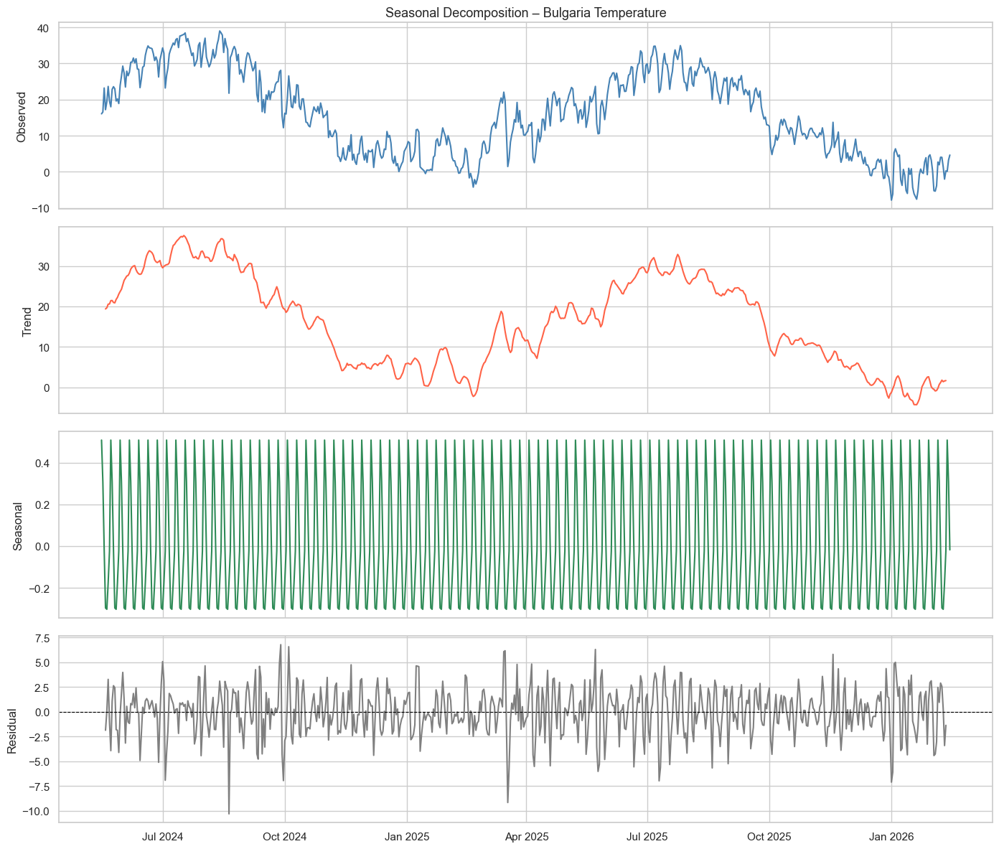

In [31]:
# Use a representative single-country series for decomposition (needs regular samples)
# Pick a country with the most observations
top_country = df['country'].value_counts().index[0]
print(f'Using country: {top_country}')

df_c = df[df['country'] == top_country].copy()
daily_c = df_c.groupby('date')['temperature_celsius'].mean().reset_index()
daily_c['date'] = pd.to_datetime(daily_c['date'])
daily_c = daily_c.sort_values('date').set_index('date')

# Fill any gaps
daily_c = daily_c.asfreq('D').interpolate(method='time')
print(f'Series length: {len(daily_c)} days, gaps filled via interpolation')

# Seasonal decomposition (additive, period=7 for weekly seasonality)
decomp = seasonal_decompose(daily_c['temperature_celsius'], model='additive', period=7)

fig, axes = plt.subplots(4, 1, figsize=(14, 12), sharex=True)
axes[0].plot(decomp.observed,  color='steelblue');  axes[0].set_ylabel('Observed');  axes[0].set_title(f'Seasonal Decomposition – {top_country} Temperature', fontsize=13)
axes[1].plot(decomp.trend,     color='tomato');     axes[1].set_ylabel('Trend')
axes[2].plot(decomp.seasonal,  color='seagreen');   axes[2].set_ylabel('Seasonal')
axes[3].plot(decomp.resid,     color='gray');       axes[3].set_ylabel('Residual')
axes[3].axhline(0, color='black', linewidth=0.8, linestyle='--')
axes[3].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.tight_layout()
plt.show()

## 4. Stationarity Testing – Augmented Dickey-Fuller (ADF)

In [32]:
def adf_report(series, name):
    result = adfuller(series.dropna(), autolag='AIC')
    labels = ['ADF Statistic','p-value','# Lags Used','# Observations']
    out = dict(zip(labels, result[:4]))
    for k, v in result[4].items():
        out[f'Critical Value ({k})'] = v
    stat = pd.Series(out).rename(name)
    verdict = '✅ STATIONARY' if result[1] < 0.05 else '❌ NON-STATIONARY'
    print(f'\n=== ADF Test: {name} === {verdict} (p={result[1]:.4f})')
    return stat

results = []
for col in ['avg_temp', 'avg_humidity', 'avg_wind', 'avg_pressure', 'avg_pm25']:
    results.append(adf_report(daily_global[col], col))

pd.DataFrame(results).T


=== ADF Test: avg_temp === ❌ NON-STATIONARY (p=0.8466)

=== ADF Test: avg_humidity === ❌ NON-STATIONARY (p=0.6941)

=== ADF Test: avg_wind === ✅ STATIONARY (p=0.0404)

=== ADF Test: avg_pressure === ❌ NON-STATIONARY (p=0.0957)

=== ADF Test: avg_pm25 === ❌ NON-STATIONARY (p=0.6389)


,avg_temp,avg_humidity,avg_wind,avg_pressure,avg_pm25
ADF Statistic,-0.700545,-1.151568,-2.944354,-2.587054,-1.278708
p-value,0.846608,0.694076,0.040428,0.095703,0.638856
# Lags Used,6.000000,12.000000,14.000000,13.000000,20.000000
# Observations,632.000000,626.000000,624.000000,625.000000,618.000000
Critical Value (1%),-3.440739,-3.440839,-3.440873,-3.440856,-3.440976
Critical Value (5%),-2.866124,-2.866168,-2.866183,-2.866175,-2.866228
Critical Value (10%),-2.569211,-2.569235,-2.569243,-2.569239,-2.569267


ADF on first-differenced temperature:

=== ADF Test: avg_temp (1st diff) === ✅ STATIONARY (p=0.0000)


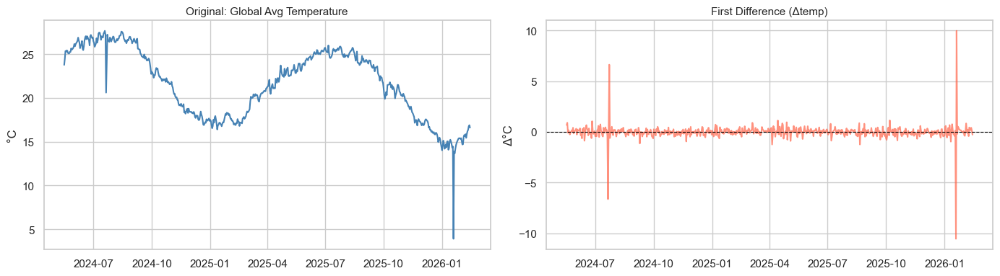

In [33]:
# First-difference to achieve stationarity if needed
daily_global['temp_diff'] = daily_global['avg_temp'].diff()
print('ADF on first-differenced temperature:')
adf_report(daily_global['temp_diff'].dropna(), 'avg_temp (1st diff)')

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(daily_global['avg_temp'], color='steelblue')
axes[0].set_title('Original: Global Avg Temperature', fontsize=11)
axes[0].set_ylabel('°C')
axes[1].plot(daily_global['temp_diff'], color='tomato', alpha=0.7)
axes[1].axhline(0, color='black', linewidth=0.8, linestyle='--')
axes[1].set_title('First Difference (Δtemp)', fontsize=11)
axes[1].set_ylabel('Δ°C')
plt.tight_layout()
plt.show()

## 5. Autocorrelation (ACF) & Partial Autocorrelation (PACF)

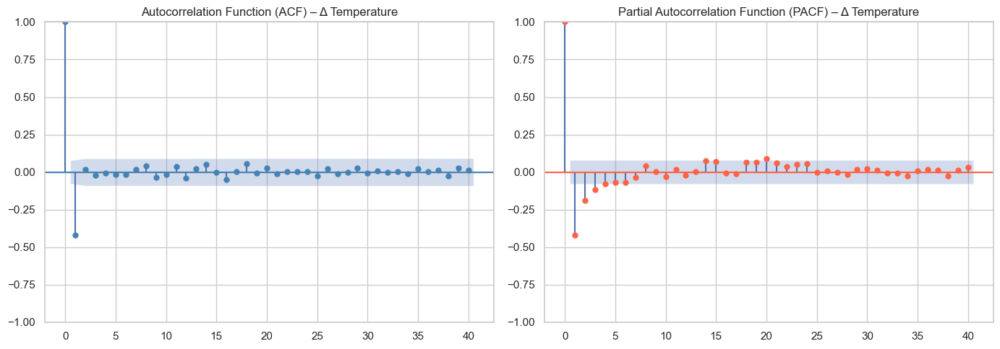

In [34]:
# ACF & PACF for global temperature (first-differenced)
series_for_acf = daily_global['temp_diff'].dropna()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
plot_acf(series_for_acf,  lags=40, ax=axes[0], alpha=0.05, color='steelblue')
axes[0].set_title('Autocorrelation Function (ACF) – Δ Temperature', fontsize=12)

plot_pacf(series_for_acf, lags=40, ax=axes[1], alpha=0.05, color='tomato', method='ywm')
axes[1].set_title('Partial Autocorrelation Function (PACF) – Δ Temperature', fontsize=12)

plt.tight_layout()
plt.show()

In [35]:
# ACF values as bar chart (Plotly – interactive)
acf_vals  = acf(series_for_acf,  nlags=30, alpha=0.05)
pacf_vals = pacf(series_for_acf, nlags=30, alpha=0.05, method='ywm')

lags = list(range(31))
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=['ACF – Global Temperature (Δ)',
                                    'PACF – Global Temperature (Δ)'])

fig.add_trace(go.Bar(x=lags, y=acf_vals[0],  name='ACF',  marker_color='steelblue'), row=1, col=1)
fig.add_trace(go.Bar(x=lags, y=pacf_vals[0], name='PACF', marker_color='tomato'),    row=1, col=2)

# 95% CI lines
ci = 1.96 / np.sqrt(len(series_for_acf))
for col_num in [1, 2]:
    fig.add_hline(y= ci, line_dash='dash', line_color='gray', row=1, col=col_num)
    fig.add_hline(y=-ci, line_dash='dash', line_color='gray', row=1, col=col_num)

fig.update_layout(height=450, title_text='Autocorrelation Analysis', showlegend=False)
fig.show()

## 6. Seasonal Patterns – Month & Hour of Day

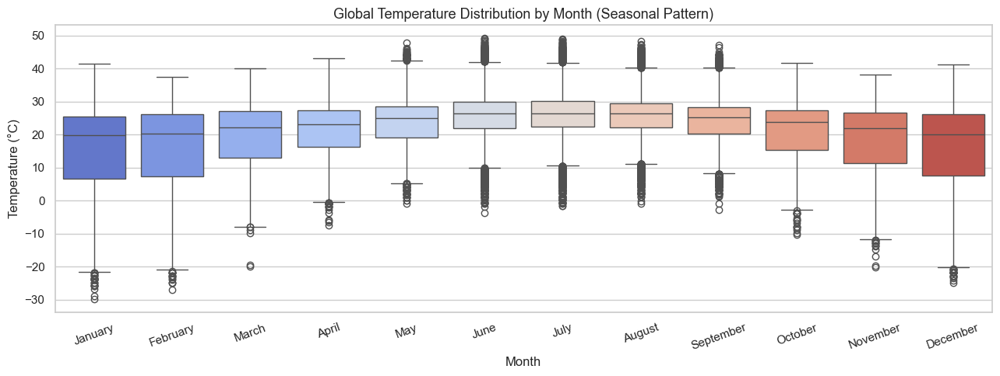

In [36]:
# Monthly pattern: box plot of global temperature by month
month_order = ['January','February','March','April','May','June',
               'July','August','September','October','November','December']
df_mo = df.dropna(subset=['month_name'])
df_mo['month_name'] = pd.Categorical(df_mo['month_name'], categories=month_order, ordered=True)
df_mo = df_mo.sort_values('month_name')

plt.figure(figsize=(13, 5))
sns.boxplot(data=df_mo, x='month_name', y='temperature_celsius',
            palette='coolwarm', order=month_order)
plt.title('Global Temperature Distribution by Month (Seasonal Pattern)', fontsize=13)
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

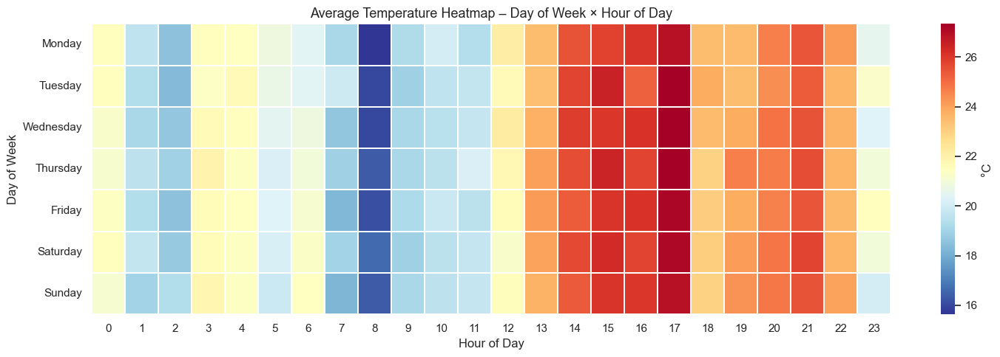

In [37]:
# Hour-of-day heatmap: avg temperature × day-of-week
dow_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
pivot_dow_hour = df.pivot_table(
    values='temperature_celsius',
    index='day_of_week',
    columns='hour',
    aggfunc='mean'
).reindex(dow_order)

plt.figure(figsize=(15, 5))
sns.heatmap(pivot_dow_hour, cmap='RdYlBu_r', annot=False, fmt='.1f',
            linewidths=0.3, cbar_kws={'label': '°C'})
plt.title('Average Temperature Heatmap – Day of Week × Hour of Day', fontsize=13)
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.tight_layout()
plt.show()

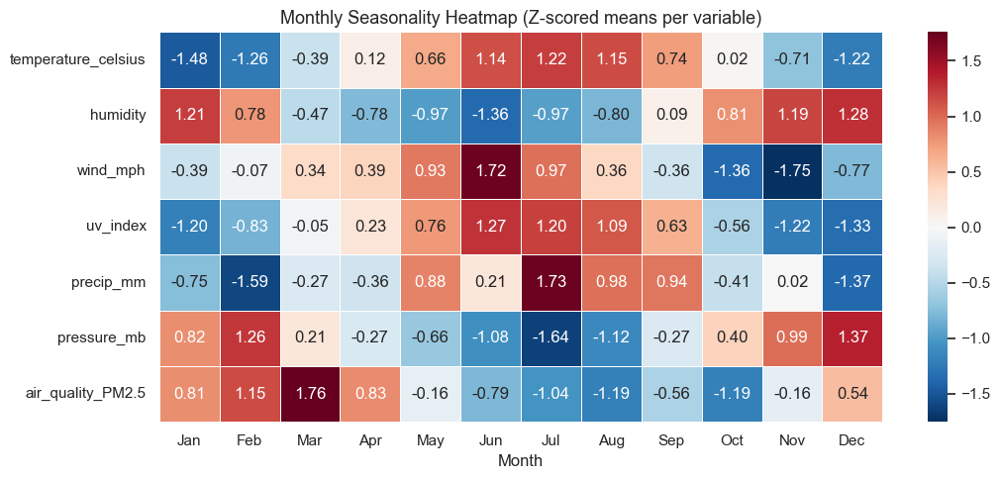

In [38]:
# Heatmap: Month × Variable — seasonal means
monthly_means = df.groupby('month')[['temperature_celsius','humidity','wind_mph',
                                       'uv_index','precip_mm','pressure_mb',
                                       'air_quality_PM2.5']].mean()
# Normalise z-score per column for fair comparison
monthly_z = (monthly_means - monthly_means.mean()) / monthly_means.std()
monthly_z.index = [month_order[i-1][:3] for i in monthly_z.index]

plt.figure(figsize=(11, 5))
sns.heatmap(monthly_z.T, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, linewidths=0.4)
plt.title('Monthly Seasonality Heatmap (Z-scored means per variable)', fontsize=13)
plt.xlabel('Month')
plt.tight_layout()
plt.show()

## 7. Multi-variable Time Series Comparison

In [39]:
# Plotly: interactive multi-variable daily trends
fig = make_subplots(
    rows=4, cols=1, shared_xaxes=True,
    subplot_titles=[
        'Avg Temperature (°C)',
        'Avg Humidity (%)',
        'Avg Wind Speed (mph)',
        'Avg PM2.5 Air Quality'
    ],
    vertical_spacing=0.07
)

palette = ['#e6550d', '#3182bd', '#31a354', '#756bb1']
variables = ['avg_temp', 'avg_humidity', 'avg_wind', 'avg_pm25']

for i, (var, color) in enumerate(zip(variables, palette), 1):
    roll = daily_global[var].rolling(7, min_periods=1).mean()
    fig.add_trace(go.Scatter(x=daily_global.index, y=daily_global[var],
                             mode='lines', line=dict(color=color, width=1),
                             opacity=0.4, name=var, showlegend=False), row=i, col=1)
    fig.add_trace(go.Scatter(x=daily_global.index, y=roll,
                             mode='lines', line=dict(color=color, width=2.5),
                             name=f'{var} (7d roll)', showlegend=True), row=i, col=1)

fig.update_layout(height=800, title_text='📈 Multi-variable Daily Time Series (with 7-day rolling average)',
                  legend=dict(orientation='h', y=-0.05))
fig.show()

## 8. Lag Analysis & Cross-correlation (Temperature vs Humidity)

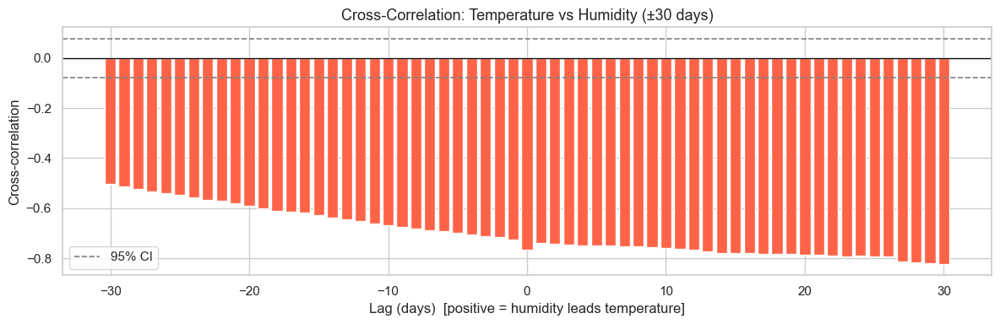

Strongest cross-correlation at lag = 30 days  (r = -0.823)


In [40]:
# Cross-correlation between temperature and humidity at different lags
temp_s  = daily_global['avg_temp'].dropna()
hum_s   = daily_global['avg_humidity'].dropna()

# Align
common  = temp_s.index.intersection(hum_s.index)
temp_s  = temp_s[common]
hum_s   = hum_s[common]

# Standardise
temp_z  = (temp_s - temp_s.mean()) / temp_s.std()
hum_z   = (hum_s  - hum_s.mean())  / hum_s.std()

max_lag = 30
lags    = range(-max_lag, max_lag + 1)
xcorr   = [temp_z.corr(hum_z.shift(lag)) for lag in lags]

plt.figure(figsize=(12, 4))
plt.bar(list(lags), xcorr, color=['tomato' if x < 0 else 'steelblue' for x in xcorr])
plt.axhline(0, color='black', linewidth=0.9)
ci = 1.96 / np.sqrt(len(temp_z))
plt.axhline( ci, color='gray', linestyle='--', linewidth=1.2, label='95% CI')
plt.axhline(-ci, color='gray', linestyle='--', linewidth=1.2)
plt.xlabel('Lag (days)  [positive = humidity leads temperature]')
plt.ylabel('Cross-correlation')
plt.title('Cross-Correlation: Temperature vs Humidity (±30 days)', fontsize=13)
plt.legend()
plt.tight_layout()
plt.show()

best_lag = list(lags)[np.argmax(np.abs(xcorr))]
print(f'Strongest cross-correlation at lag = {best_lag} days  (r = {xcorr[best_lag + max_lag]:.3f})')

## 9. Country-level Comparative Time Series

In [41]:
# Pick 6 geographically diverse countries
selected = ['India', 'United States of America', 'Brazil', 'Australia', 'Russia', 'Egypt']
available = [c for c in selected if c in df['country'].unique()]
if not available:
    available = df['country'].value_counts().head(6).index.tolist()
print('Countries selected:', available)

df_sel = df[df['country'].isin(available)]
country_daily = df_sel.groupby(['country','date'])['temperature_celsius'].mean().reset_index()
country_daily['date'] = pd.to_datetime(country_daily['date'])
country_daily = country_daily.sort_values('date')

# 7-day rolling per country using transform
country_daily['rolling_temp'] = (
    country_daily.groupby('country')['temperature_celsius']
    .transform(lambda x: x.rolling(7, min_periods=1).mean())
)

fig = px.line(
    country_daily, x='date', y='rolling_temp', color='country',
    title='🌡️ 7-Day Rolling Average Temperature – Country Comparison',
    labels={'rolling_temp': 'Rolling Avg Temp (°C)', 'date': 'Date'}
)
fig.update_layout(height=500)
fig.show()

Countries selected: ['India', 'United States of America', 'Brazil', 'Australia', 'Russia', 'Egypt']


## 10. Anomaly Detection on Time Series (Z-Score Method)

Anomalies detected: 15 high, 35 low


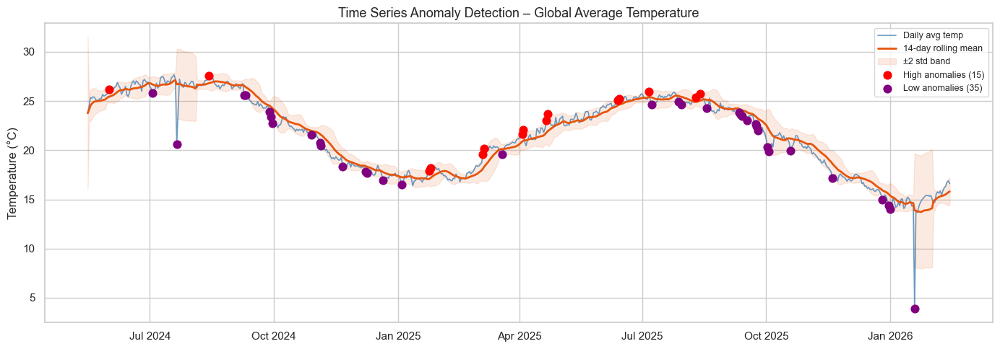

In [42]:
# Detect daily anomalies on global temperature series
ts = daily_global['avg_temp'].copy()
roll_mean = ts.rolling(14, min_periods=1).mean()
roll_std  = ts.rolling(14, min_periods=1).std().fillna(ts.std())

z_scores   = (ts - roll_mean) / roll_std
anomaly_up = ts[z_scores >  2.0]
anomaly_dn = ts[z_scores < -2.0]

print(f'Anomalies detected: {len(anomaly_up)} high, {len(anomaly_dn)} low')

plt.figure(figsize=(14, 5))
plt.plot(ts.index, ts, color='steelblue', linewidth=1.2, alpha=0.8, label='Daily avg temp')
plt.plot(ts.index, roll_mean, color='#e6550d', linewidth=2, label='14-day rolling mean')
plt.fill_between(ts.index,
                  roll_mean - 2*roll_std,
                  roll_mean + 2*roll_std,
                  alpha=0.12, color='#e6550d', label='±2 std band')
plt.scatter(anomaly_up.index, anomaly_up, color='red',   zorder=5, s=60, label=f'High anomalies ({len(anomaly_up)})')
plt.scatter(anomaly_dn.index, anomaly_dn, color='purple', zorder=5, s=60, label=f'Low anomalies ({len(anomaly_dn)})')
plt.title('Time Series Anomaly Detection – Global Average Temperature', fontsize=13)
plt.ylabel('Temperature (°C)')
plt.legend(fontsize=9)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.tight_layout()
plt.show()

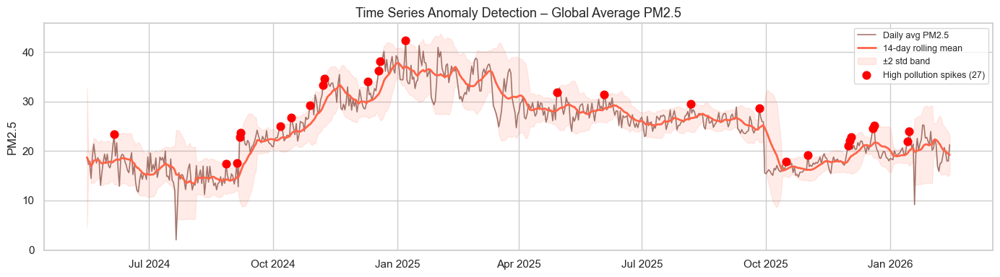

In [43]:
# PM2.5 anomaly detection
ts_pm = daily_global['avg_pm25'].copy()
roll_mean_pm = ts_pm.rolling(14, min_periods=1).mean()
roll_std_pm  = ts_pm.rolling(14, min_periods=1).std().fillna(ts_pm.std())
z_pm = (ts_pm - roll_mean_pm) / roll_std_pm
anomaly_pm = ts_pm[z_pm > 2.0]

plt.figure(figsize=(14, 4))
plt.plot(ts_pm.index, ts_pm, color='#8c564b', linewidth=1.2, alpha=0.8, label='Daily avg PM2.5')
plt.plot(ts_pm.index, roll_mean_pm, color='tomato', linewidth=2, label='14-day rolling mean')
plt.fill_between(ts_pm.index,
                  roll_mean_pm - 2*roll_std_pm,
                  roll_mean_pm + 2*roll_std_pm,
                  alpha=0.12, color='tomato', label='±2 std band')
plt.scatter(anomaly_pm.index, anomaly_pm, color='red', zorder=5, s=60, label=f'High pollution spikes ({len(anomaly_pm)})')
plt.title('Time Series Anomaly Detection – Global Average PM2.5', fontsize=13)
plt.ylabel('PM2.5')
plt.legend(fontsize=9)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.tight_layout()
plt.show()

## 11. Forecasting – Exponentially Weighted Moving Average (EWM)

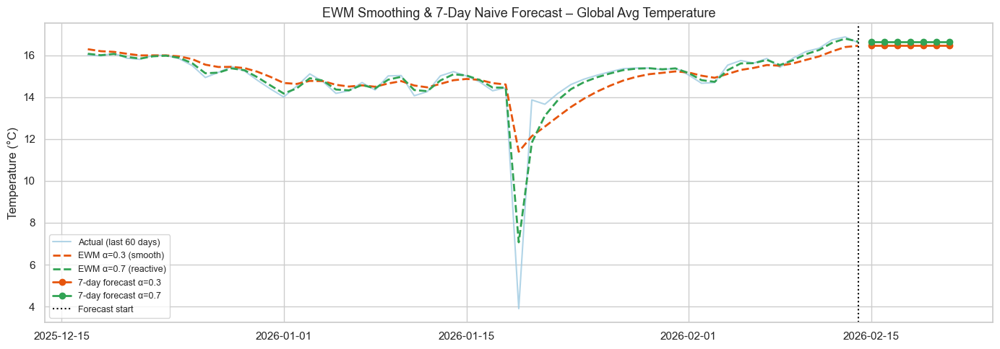

α=0.3 forecast: 16.46°C  |  α=0.7 forecast: 16.66°C


In [44]:
# Exponential smoothing forecast (EWM) – simple but interpretable
ts = daily_global['avg_temp'].dropna()

ewm_alpha03 = ts.ewm(alpha=0.3, adjust=False).mean()
ewm_alpha07 = ts.ewm(alpha=0.7, adjust=False).mean()

# Naive 7-day forecast using last EWM value repeated
last_val_03 = ewm_alpha03.iloc[-1]
last_val_07 = ewm_alpha07.iloc[-1]
last_date   = ts.index[-1]
forecast_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=7, freq='D')
forecast_03    = pd.Series([last_val_03]*7, index=forecast_dates)
forecast_07    = pd.Series([last_val_07]*7, index=forecast_dates)

plt.figure(figsize=(14, 5))
plt.plot(ts.index[-60:], ts[-60:], color='#9ecae1', linewidth=1.5, alpha=0.8, label='Actual (last 60 days)')
plt.plot(ewm_alpha03[-60:], '--', color='#e6550d', linewidth=2, label='EWM α=0.3 (smooth)')
plt.plot(ewm_alpha07[-60:], '--', color='#31a354', linewidth=2, label='EWM α=0.7 (reactive)')
plt.plot(forecast_dates, forecast_03, 'o-', color='#e6550d', linewidth=2, markersize=6, label='7-day forecast α=0.3')
plt.plot(forecast_dates, forecast_07, 'o-', color='#31a354', linewidth=2, markersize=6, label='7-day forecast α=0.7')
plt.axvline(last_date, color='black', linestyle=':', linewidth=1.5, label='Forecast start')
plt.title('EWM Smoothing & 7-Day Naive Forecast – Global Avg Temperature', fontsize=13)
plt.ylabel('Temperature (°C)')
plt.legend(fontsize=9)
plt.tight_layout()
plt.show()

print(f'α=0.3 forecast: {last_val_03:.2f}°C  |  α=0.7 forecast: {last_val_07:.2f}°C')

## 12. Weekly Aggregation & Resampling

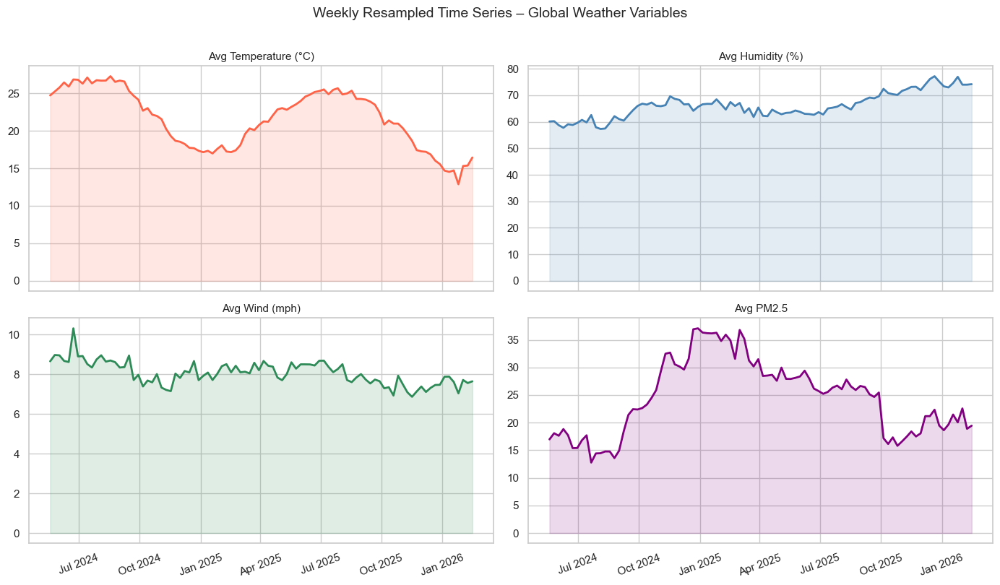

In [45]:
# Resample to weekly using pandas resample()
ts_weekly = daily_global[['avg_temp','avg_humidity','avg_wind','avg_pm25']].resample('W').mean()

fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex=True)
ax_list = axes.flatten()
cols    = ['avg_temp','avg_humidity','avg_wind','avg_pm25']
colors  = ['tomato','steelblue','seagreen','purple']
titles  = ['Avg Temperature (°C)','Avg Humidity (%)','Avg Wind (mph)','Avg PM2.5']

for ax, col, color, title in zip(ax_list, cols, colors, titles):
    ax.plot(ts_weekly.index, ts_weekly[col], color=color, linewidth=2)
    ax.fill_between(ts_weekly.index, ts_weekly[col], alpha=0.15, color=color)
    ax.set_title(title, fontsize=11)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.tick_params(axis='x', rotation=20)

plt.suptitle('Weekly Resampled Time Series – Global Weather Variables', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

## Summary

| Technique | What It Shows |
|---|---|
| Rolling mean & std | Trend smoothing + volatility over time |
| Seasonal decomposition | Trend / Seasonal / Residual components (per-country) |
| ADF test | Stationarity assessment for 5 variables |
| First differencing | Make non-stationary series stationary |
| ACF / PACF | Lag structure and autocorrelation |
| Monthly box plots | Seasonal temperature distribution |
| DoW × Hour heatmap | Within-week + intra-day temperature patterns |
| Month × Variable heatmap | Z-scored seasonal patterns across all variables |
| Multi-variable Plotly trend | Interactive daily trends for 4 variables |
| Cross-correlation | Temperature vs Humidity at ±30-day lags |
| Country comparison (rolling) | Geographic temperature divergence over time |
| Anomaly detection (temp) | Z-score on rolling window → flag outlier days |
| Anomaly detection (PM2.5) | Pollution spikes over time |
| EWM forecasting | Simple 7-day exponential smoothing forecast |
| Weekly resampling | `resample('W')` aggregated trends |